# **Analyze Proximal and Distal Cells from Immune Cell Hubs**
Cell composition and differential gene expression analysis

# **Setup the environment**

In [107]:
%%capture
!pip install -q scanpy==1.10.1
!pip install -q anndata==0.10.7
!pip install -q squidpy==1.6.1
!pip install -q rasterio==1.4.3
!pip install -q google-cloud-storage

In [108]:
import numpy as np
import pandas as pd
import scanpy as sc
import squidpy as sq
from matplotlib import pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)

from google.colab import drive
drive.mount('/content/drive')

from google.colab import auth # Authenticate your Colab environment to access your Google Cloud account.
auth.authenticate_user()

# **Load annotated scanpy instance**

In [109]:
ad = sc.read_h5ad("./HumanUterineCancerPatient2-ROCostain_annotated.hdf5")
ad

AnnData object with n_obs × n_vars = 74392 × 500
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'Anti-Ms-CD45RO_raw', 'Anti-Ms-CD45RO_high_pass', 'Cellbound3_raw', 'Cellbound3_high_pass', 'Cellbound2_raw', 'Cellbound2_high_pass', 'Cellbound1_raw', 'Cellbound1_high_pass', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'barcodeCount', 'volume_factor', 'leiden', 'manual_annot'
    var: 'mean', 'std'
    uns: 'dendrogram_leiden', 'leiden', 'leiden_colors', 'log1p', 'manual_annot_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# Create a connectivity graph and spatial_distances of cells within 100 um radius

In [110]:
sq.gr.spatial_neighbors(ad, coord_type="generic", radius = 100, spatial_key="spatial")

Creating graph using `generic` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:01)


The sparse dataframe adata.obsp['spatial_distances'] stores cell distance based on obsm['spatial'] in um. </br>
Use this information to determine proximal-distal cells


## Get the paired distances df with cell ids and cel type

In [111]:
# Import necessary libraries
from scipy.sparse import coo_matrix # for Coordinate list formatting

# Create distance df

spatial_distances = ad.obsp["spatial_distances"]
spatial_distances_coo = spatial_distances.tocoo()

distances_df = pd.DataFrame({
    "source": spatial_distances_coo.row,   # Source cell indices
    "target": spatial_distances_coo.col,   # Neighbor cell indices
    "distance": spatial_distances_coo.data  # Distances between the cells
})

distances_df["source"] = distances_df["source"].astype(object)
distances_df["target"] = distances_df["target"].astype(object)
distances_df.loc[:, "source"] = distances_df["source"].map(dict(enumerate(ad.obs.index)))
distances_df.loc[:, "target"] = distances_df["target"].map(dict(enumerate(ad.obs.index)))

distances_df['source_cell_type'] = distances_df['source'].map(ad.obs['manual_annot'].to_dict())
distances_df['target_cell_type'] = distances_df['target'].map(ad.obs['manual_annot'].to_dict())

distances_df

,source,target,distance,source_cell_type,target_cell_type
0,267305200237100734,267305200237200180,56.035516,Immune cell,Cancer cell_2
1,267305200237100734,267305200237100682,14.125946,Immune cell,Cancer cell_3
2,267305200237100734,267305200237100958,83.012572,Immune cell,Cancer cell_3
3,267305200237100734,267305200237101381,99.705066,Immune cell,Cancer cell_2
4,267305200237100734,267305200237100415,79.069300,Immune cell,Cancer cell_3
...,...,...,...,...,...
2799025,267305200237100747,267305200237100780,12.817553,Cancer cell_3,Cancer cell_3
2799026,267305200237100747,267305200237200092,74.360927,Cancer cell_3,Immune cell
2799027,267305200237100747,267305200237100547,29.474549,Cancer cell_3,Endometrium (inflammating)
2799028,267305200237100747,267305200237200620,83.904320,Cancer cell_3,Cancer cell_2


# Define hub cells (immune cell)

In [112]:
# get hub cell ids
hub_cell_id = distances_df.loc[distances_df['source_cell_type'].str.startswith('Immune'), 'source']
print(len(hub_cell_id))

# get neighbors
cell_from_hub = distances_df.copy()
cell_from_hub = cell_from_hub[(cell_from_hub['source'].isin(hub_cell_id)) & ~(cell_from_hub['target'].isin(hub_cell_id))] # ensure there is no hub cells included in targets

cell_from_hub_w_duplicated_targets = cell_from_hub.copy()

# keep the closest target cells
cell_from_hub = cell_from_hub.loc[cell_from_hub.groupby('target')['distance'].idxmin()]

cell_from_hub

357897


,source,target,distance,source_cell_type,target_cell_type
387784,267305200005101787,267305200004100137,98.256693,Immune cell,Cancer cell_3
2696186,267305200005101933,267305200004100220,86.093418,Immune cell (T Cell),Cancer cell_2
387783,267305200005101787,267305200004100229,76.954047,Immune cell,Endometrium (antigen presenting)
2696192,267305200005101933,267305200004100256,71.788274,Immune cell (T Cell),Endometrium
2696179,267305200005101933,267305200004100265,93.855643,Immune cell (T Cell),Cancer cell_2
...,...,...,...,...,...
942071,267305200494201332,267305200515100791,45.480553,Immune cell (T Cell),Cancer cell_6 (Metastasis)
2794977,267305200515100626,267305200515100798,52.805303,Immune cell,Smooth muscle
2794976,267305200515100626,267305200515100800,73.712821,Immune cell,Smooth muscle
942072,267305200494201332,267305200515100805,53.009187,Immune cell (T Cell),Cancer cell_6 (Metastasis)


## Calculate the closest distance from hub cells to each cell type

In [113]:
# sort by mean
display(cell_from_hub.groupby('target_cell_type')['distance'].describe().sort_values('mean', ascending = True))

# sort by median
display(pd.DataFrame(cell_from_hub.groupby('target_cell_type')['distance'].median().sort_values(ascending = True)))

,count,mean,std,min,25%,50%,75%,max
target_cell_type,,,,,,,,
Smooth muscle,2779.0,33.819479,21.501907,4.458403,17.247677,28.274869,45.422024,99.923423
Endothelium,1845.0,35.114254,21.700607,4.353185,18.219397,29.729084,47.941897,99.757577
Cancer cell_8 (Metastasis/Senescent),1773.0,40.073566,21.497480,3.796181,22.681926,36.415244,54.924974,99.469811
Endometrium (antigen presenting),4067.0,42.572792,20.519352,3.612607,26.896856,39.797423,56.660562,99.823379
Endometrium,10460.0,45.052103,21.395793,4.461386,28.607036,42.494432,59.684123,99.893573
Cancer cell_3,5194.0,46.556351,22.447351,4.081685,29.043558,44.293457,62.407920,99.952356
Cancer cell_2,5527.0,47.773382,22.328032,5.150859,30.186717,45.632889,64.094900,99.901322
Endometrium (inflammating),2272.0,49.567974,24.157252,4.128892,30.048522,48.033223,68.259192,99.945628
Cancer cell_9,663.0,50.554261,21.040198,7.983850,34.752273,48.534785,64.600526,99.539654


,distance
target_cell_type,
Smooth muscle,28.274869
Endothelium,29.729084
Cancer cell_8 (Metastasis/Senescent),36.415244
Endometrium (antigen presenting),39.797423
Endometrium,42.494432
Cancer cell_3,44.293457
Cancer cell_2,45.632889
Endometrium (inflammating),48.033223
Cancer cell_9,48.534785


## Calculate the proportion of closest neighbor cell types

In [114]:
dist_thr = 10
print(f'Within {dist_thr} um distance')
proximal_cells = cell_from_hub[cell_from_hub['distance'] <= dist_thr].copy()
display(pd.DataFrame({'count' : proximal_cells['target_cell_type'].value_counts(),
              'ratio' : proximal_cells['target_cell_type'].value_counts(normalize=True)}))


dist_thr = 20
print(f'Within {dist_thr} um distance')
proximal_cells = cell_from_hub[cell_from_hub['distance'] <= dist_thr].copy()
display(pd.DataFrame({'count' : proximal_cells['target_cell_type'].value_counts(),
              'ratio' : proximal_cells['target_cell_type'].value_counts(normalize=True)}))

Within 10 um distance


,count,ratio
target_cell_type,,
Endometrium,235,0.170167
Smooth muscle,228,0.165098
Endothelium,135,0.097755
Cancer cell_3,134,0.097031
Cancer cell_2,98,0.070963
Endometrium (antigen presenting),92,0.066618
Cancer cell_8 (Metastasis/Senescent),85,0.061550
Endometrium (inflammating),76,0.055033
Cancer cell_1,76,0.055033


Within 20 um distance


,count,ratio
target_cell_type,,
Endometrium,1265,0.189286
Smooth muscle,890,0.133174
Cancer cell_3,634,0.094868
Cancer cell_2,597,0.089331
Endothelium,561,0.083944
Endometrium (antigen presenting),556,0.083196
Cancer cell_5,388,0.058058
Cancer cell_1,364,0.054467
Cancer cell_8 (Metastasis/Senescent),348,0.052072


## Use chi-square test to validate whether the observed cell type ratios are statistically different from whole tissue observations

In [115]:
cell_type_count_df = pd.DataFrame({'whole_tissue_count' : ad.obs['manual_annot'].value_counts(),
                         'count_within_10um' : cell_from_hub.loc[cell_from_hub['distance'] <= 10, 'target_cell_type'].value_counts(),
                         'count_within_20um' : cell_from_hub.loc[cell_from_hub['distance'] <= 20, 'target_cell_type'].value_counts()})

cell_type_count_df = cell_type_count_df.loc[~cell_type_count_df.index.str.startswith('Immune'), :].copy() # remove immune cells from the count dataframe to focus on comparing the rest cell types
display(cell_type_count_df)

,whole_tissue_count,count_within_10um,count_within_20um
Cancer cell_1,7877,76.0,364.0
Cancer cell_2,5829,98.0,597.0
Cancer cell_3,5464,134.0,634.0
Cancer cell_4,5198,54.0,338.0
Cancer cell_5,5092,67.0,388.0
Cancer cell_6 (Metastasis),3000,40.0,147.0
Cancer cell_7,2827,37.0,186.0
Cancer cell_8 (Metastasis/Senescent),1847,85.0,348.0
Cancer cell_9,755,4.0,41.0
Cancer stem cell,3608,20.0,113.0


In [116]:
import scipy.stats as stats

# Perform chi-square test for count_within_10um vs whole_tissue_count
chi2_10um, p_10um, dof_10um, expected_10um = stats.chi2_contingency([cell_type_count_df["count_within_10um"], cell_type_count_df["whole_tissue_count"]])

# Perform chi-square test for count_within_20um vs whole_tissue_count
chi2_20um, p_20um, dof_20um, expected_20um = stats.chi2_contingency([cell_type_count_df["count_within_20um"], cell_type_count_df["whole_tissue_count"]])

# Display results
chi2_results = pd.DataFrame({
        "Comparison": ["count_within_10um vs whole_tissue", "count_within_20um vs whole_tissue"],
        "Chi-Square Statistic": [chi2_10um, chi2_20um],
        "p-value": [p_10um, p_20um],
        "Degrees of Freedom": [dof_10um, dof_20um]
    })
display(chi2_results)


# Calculate observed vs expected deviations for count_within_10um
observed_10um = cell_type_count_df["count_within_10um"]
expected_10um = expected_10um[0]  # Extract expected counts for count_within_10um
deviation_10um = (observed_10um - expected_10um) / expected_10um  # Relative deviation

# Calculate observed vs expected deviations for count_within_20um
observed_20um = cell_type_count_df["count_within_20um"]
expected_20um = expected_20um[0]  # Extract expected counts for count_within_20um
deviation_20um = (observed_20um - expected_20um) / expected_20um  # Relative deviation

# Create a summary dataframe
significant_representation = pd.DataFrame({
        "Cell Type": cell_type_count_df.index,
        "Observed_10um": observed_10um,
        "Expected_10um": expected_10um,
        "Deviation_10um": deviation_10um,
        "Observed_20um": observed_20um,
        "Expected_20um": expected_20um,
        "Deviation_20um": deviation_20um
    }).sort_values(by=["Deviation_10um", "Deviation_20um"], ascending=False)

display(significant_representation)

,Comparison,Chi-Square Statistic,p-value,Degrees of Freedom
0,count_within_10um vs whole_tissue,830.112618,3.989821e-168,14
1,count_within_20um vs whole_tissue,2191.510237,0.000000e+00,14


,Cell Type,Observed_10um,Expected_10um,Deviation_10um,Observed_20um,Expected_20um,Deviation_20um
Smooth muscle,Smooth muscle,228.0,66.157329,2.446330,890.0,358.649710,1.481530
Endothelium,Endothelium,135.0,43.585013,2.097395,561.0,235.325540,1.383932
Cancer cell_8 (Metastasis/Senescent),Cancer cell_8 (Metastasis/Senescent),85.0,40.718688,1.087494,348.0,207.112895,0.680243
Endometrium (inflammating),Endometrium (inflammating),76.0,59.012591,0.287861,255.0,281.088526,-0.092812
Cancer cell_3,Cancer cell_3,134.0,117.983029,0.135757,634.0,575.386985,0.101867
Endometrium (antigen presenting),Endometrium (antigen presenting),92.0,90.120656,0.020854,556.0,447.250625,0.243151
Endometrium,Endometrium,235.0,234.575048,0.001812,1265.0,1147.377130,0.102515
Cancer cell_2,Cancer cell_2,98.0,124.917009,-0.215479,597.0,606.335974,-0.015397
Cancer cell_6 (Metastasis),Cancer cell_6 (Metastasis),40.0,64.070813,-0.375691,147.0,296.940446,-0.504951
Cancer cell_5,Cancer cell_5,67.0,108.730698,-0.383799,388.0,517.074562,-0.249625


* Positive Deviation (>0): The cell type is overrepresented in the subdomain compared to the whole tissue.
* Negative Deviation (<0): The cell type is underrepresented in the subdomain.
* Higher absolute values indicate stronger deviations from expectation.

* Smooth muscle and Endothelium are the most significantly overrepresented in both 10µm and 20µm subdomains.
* Cancer cell 8 (Metastasis/Senescent) also shows enrichment.

## Plot distances of closest target cells by type from hubs in density plot

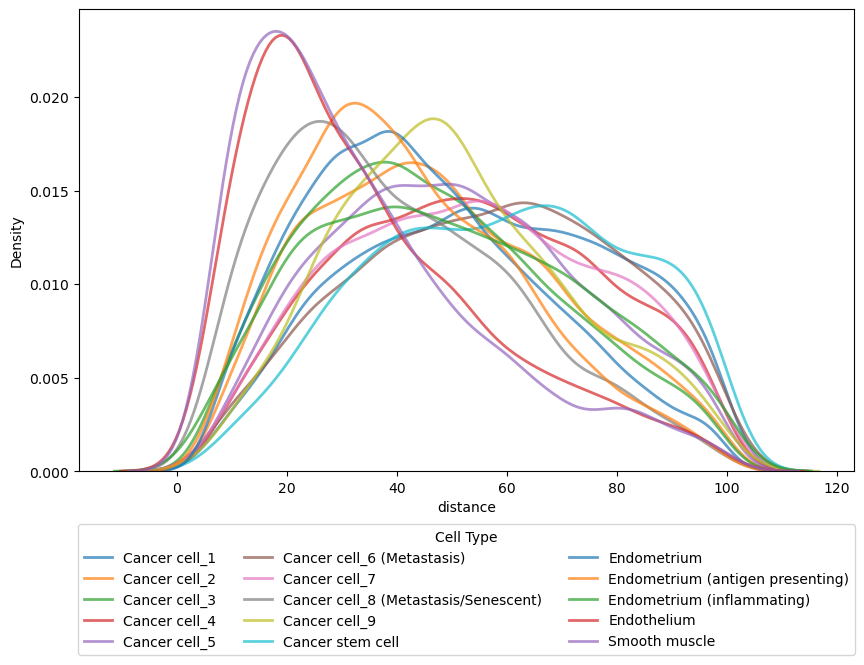

In [117]:
# Adjust plot size
plt.figure(figsize=(10, 6))

category_order = [c for c in ad.obs['manual_annot'].cat.categories if c in cell_from_hub['target_cell_type'].unique()]

# Plot the KDE plot with explicit labels
for category in category_order:
    subset = cell_from_hub[cell_from_hub['target_cell_type'] == category]
    sns.kdeplot(data=subset, x='distance', fill=False, alpha=0.7, label=category, linewidth = 2)

# Add legend explicitly
plt.legend(title='Cell Type', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)

# Show the plot
plt.show()

## Randomly plot 10 hub cell neighborhoods

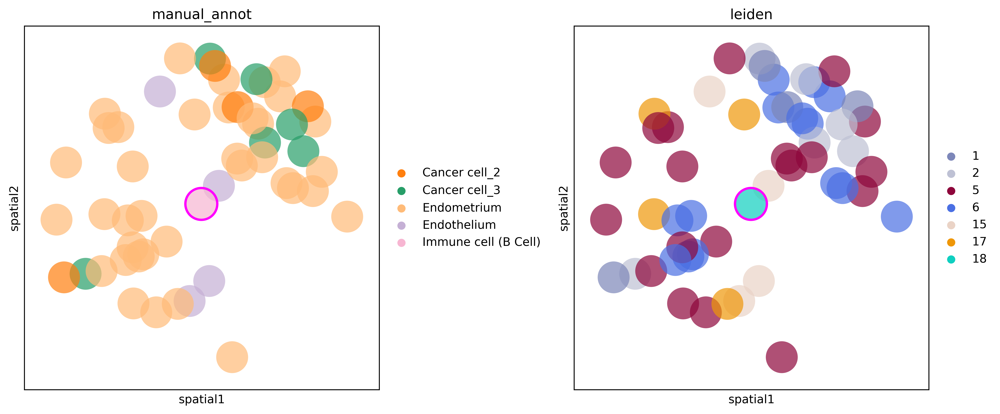

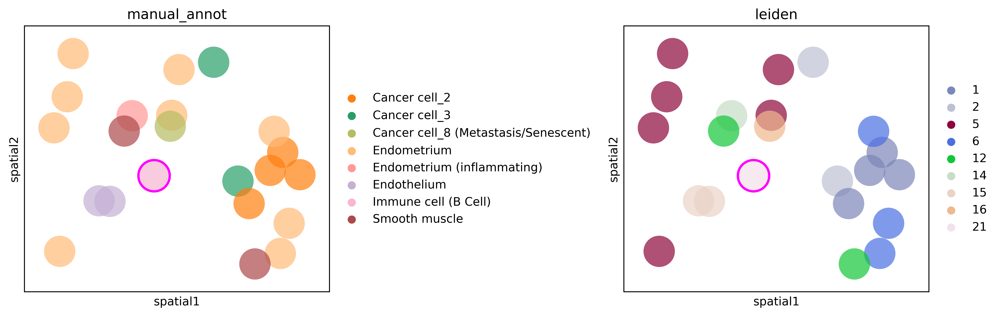

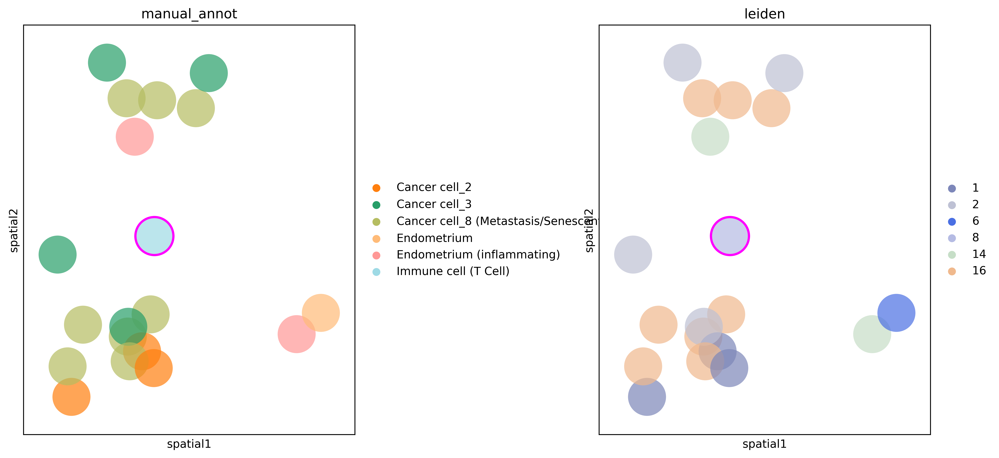

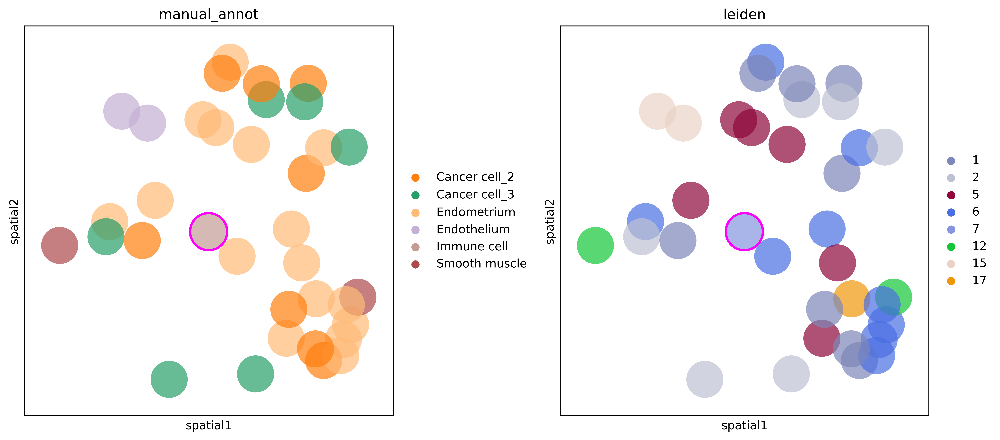

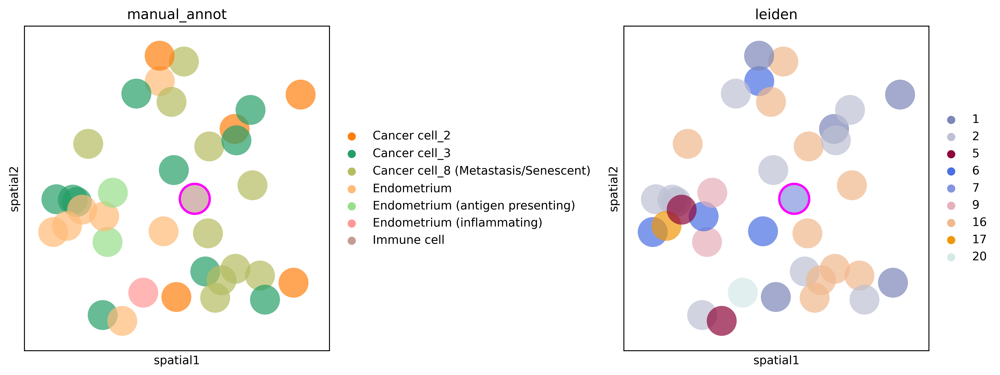

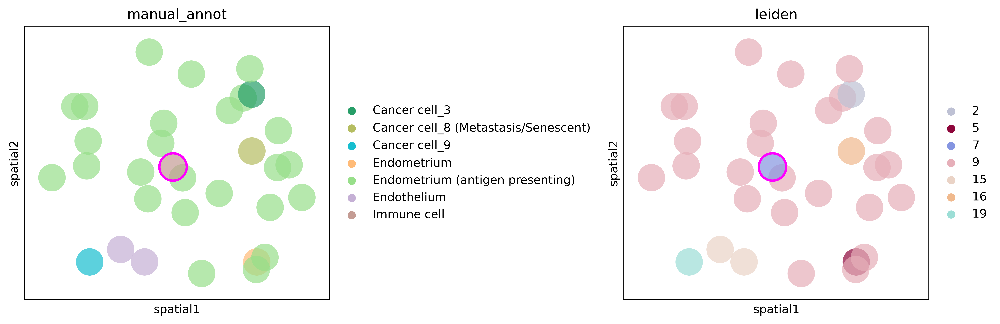

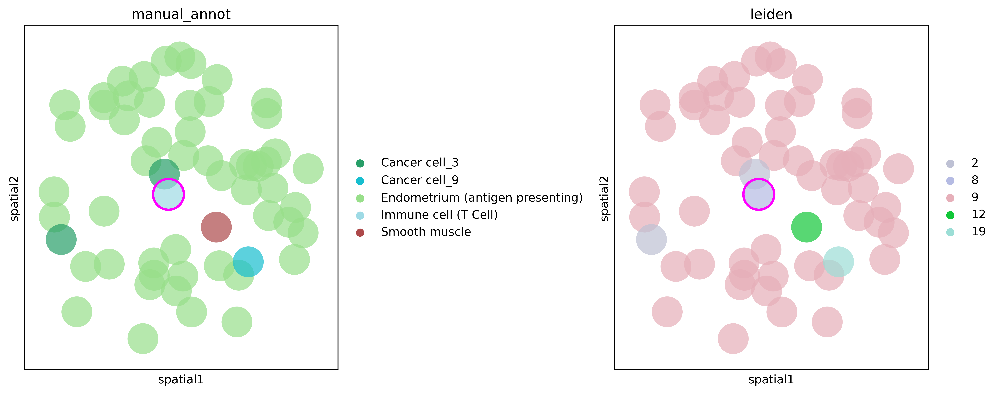

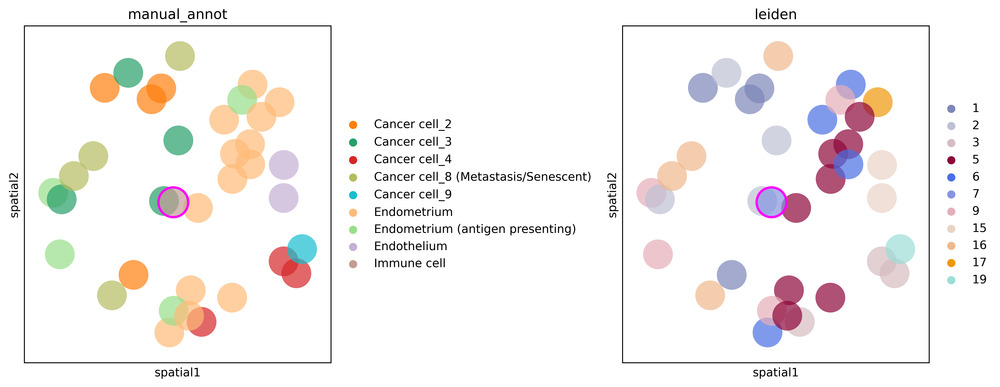

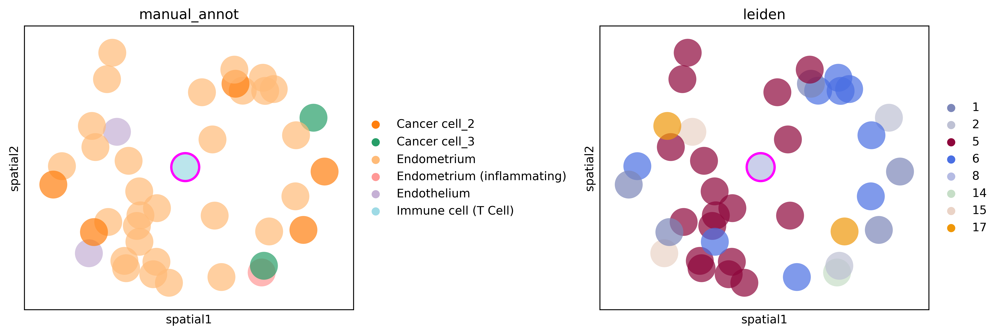

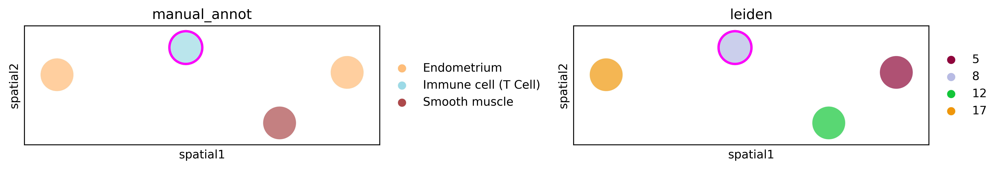

In [118]:
import random
from matplotlib.patches import Circle

random.seed(126)

n_hubs_nb_to_plot = 10

random_hub_cells = random.sample(list(hub_cell_id), n_hubs_nb_to_plot)

col_to_plot = ['manual_annot', 'leiden']

for hc in random_hub_cells:
    id_to_plot = cell_from_hub_w_duplicated_targets.loc[cell_from_hub_w_duplicated_targets['source'] == hc, 'target'].to_list() + [hc]
  
    highlight_coords = ad.obsm['spatial'][ad.obs.index == hc,]

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=600)  # 1 row, 2 columns

    # Set rc_context for consistent plotting
    with rc_context({'savefig.dpi': 600}):
        # Loop through columns to plot in the subplots
        for ax, col in zip(axes, col_to_plot):
            sc.pl.spatial(ad[id_to_plot], color=col, spot_size=20, alpha=0.7, ax=ax, show=False)
            
            # Add red circle(s) to the subplot for highlighting
            for (x, y) in highlight_coords:
                circle = Circle((x, y), radius=10, edgecolor='magenta', facecolor='none', lw=2)
                ax.add_patch(circle)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

# Proximal-distal cell type proportion analysis
Use aribitrary thresholds to distinguish proximal and distal cells from hub cells (immune cells)

In [119]:
# define proximal-distal distance cut-offs
proximal_cut = 10
distal_cut = 50

In [120]:
filtered_distances = cell_from_hub.copy() # Use .copy() to avoid SettingWithCopyWarning
filtered_distances = filtered_distances.sort_values('distance', ascending = True)
print(len(filtered_distances))
filtered_distances = filtered_distances[~filtered_distances['target'].duplicated(keep = 'first')] # get unique target cells
filtered_distances

56203


,source,target,distance,source_cell_type,target_cell_type
2758477,267305200028200732,267305200028101632,3.612607,Immune cell,Endometrium (antigen presenting)
1237972,267305200110102619,267305200110102622,3.796181,Immune cell,Cancer cell_8 (Metastasis/Senescent)
697622,267305200071100438,267305200071100442,4.081685,Immune cell,Cancer cell_3
1171754,267305200256100475,267305200256200242,4.128892,Immune cell,Endometrium (inflammating)
1296443,267305200152201251,267305200152102316,4.270382,Immune cell (T Cell),Cancer cell_3
...,...,...,...,...,...
1814580,267305200391101899,267305200391200687,99.971032,Immune cell,Cancer cell_5
761740,267305200353101775,267305200353102468,99.979229,Immune cell (T Cell),Cancer stem cell
813809,267305200412104318,267305200413103438,99.981004,Immune cell,Cancer cell_5
1953484,267305200434101880,267305200434102516,99.992698,Immune cell,Cancer cell_5


In [121]:
proximal_df = filtered_distances[filtered_distances['distance'] <= proximal_cut].copy()
print(f'Number of proximal cells: {len(proximal_df)}')

distal_df = filtered_distances[(filtered_distances['distance'] > proximal_cut) & (filtered_distances['distance'] <= distal_cut)].copy()
print(f'Number of distal cells: {len(distal_df)}')

Number of proximal cells: 1381
Number of distal cells: 29886


C:\Users\ChengYiChen\AppData\Local\Temp\ipykernel_14188\2179327260.py:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


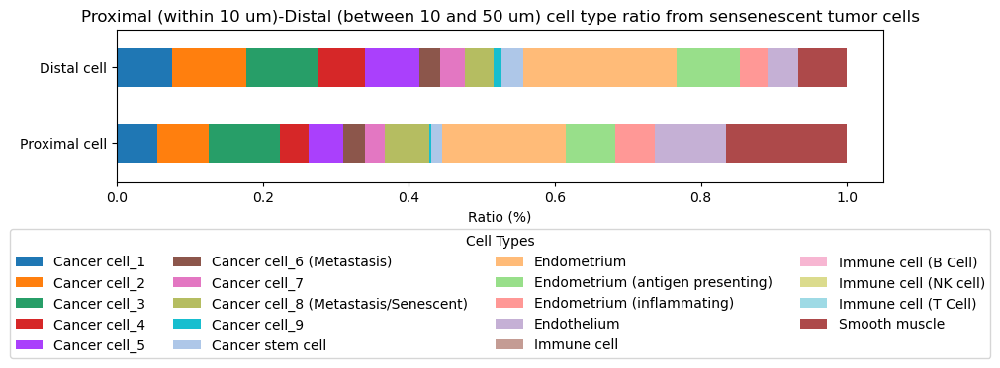

In [122]:
# Check the composition of proximal and distal cells
proximal_ratios = proximal_df['target_cell_type'].value_counts(normalize=True).sort_index()
distal_ratios = distal_df['target_cell_type'].value_counts(normalize=True).sort_index()

df_to_plot = pd.DataFrame({'Proximal cell' : proximal_ratios,
              'Distal cell' : distal_ratios}, index = ad.obs['manual_annot'].cat.categories).fillna(0).T

# Map colors from the dictionary to the dataframe columns
manual_annot_color_dict = dict(zip(ad.obs['manual_annot'].cat.categories, ad.uns['manual_annot_colors']))

colors = [manual_annot_color_dict.get(col, '#333333') for col in df_to_plot.columns]

# Creating the horizontal stacked bar plot with specified colors
ax = df_to_plot.plot(kind="barh", stacked=True, figsize=(10, 1 * len(df_to_plot)), color=colors)

# Adding labels and title
plt.xlabel("Ratio (%)")
plt.ylabel("")
plt.title(f'Proximal (within {proximal_cut} um)-Distal (between {proximal_cut} and {distal_cut} um) cell type ratio from sensenescent tumor cells')

# Adjusting the legend
plt.legend(
    loc='upper center',  # Position the legend at the top center of the plot
    bbox_to_anchor=(0.5, -0.27),  # Move the legend below the plot
    ncol=4,  # Arrange the legend in 3 columns
    title="Cell Types"  # Optional: Add a title for the legend
)

# Display the plot
plt.tight_layout()
plt.show()


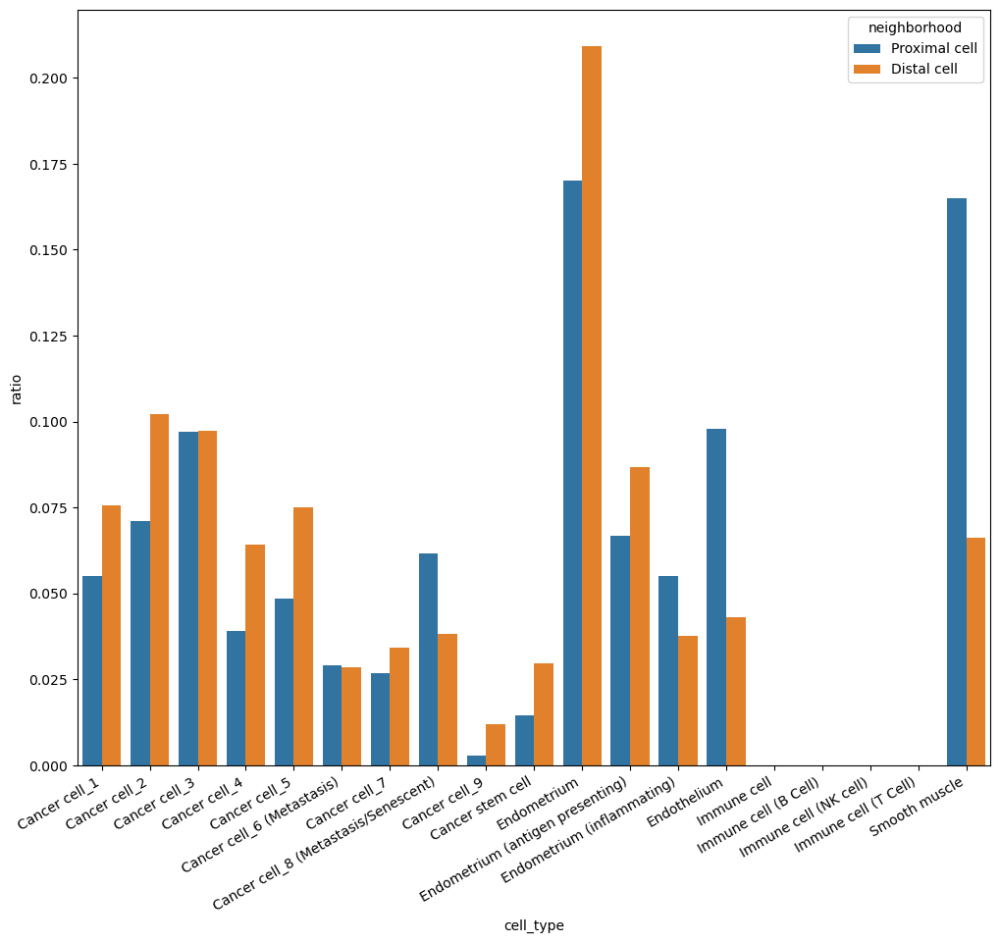

In [123]:
# compare cell type ratio side-by-side
df_to_plot = df_to_plot.reset_index(names = 'neighborhood').melt(id_vars = 'neighborhood', var_name = 'cell_type', value_name = 'ratio')

plt.figure(figsize=(12, 10))

sns.barplot(df_to_plot, x="cell_type", y="ratio", hue="neighborhood")

plt.xticks(rotation=30, ha = 'right')

# Show the plot
plt.show()

# Proximal-distal tumor cell DGE
Test whether tumor cells closer to immune cells have differential gene expression

There are 1381 proximal cells
There are 29886 distal cells


,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,...,Cellbound1_high_pass,PolyT_raw,PolyT_high_pass,DAPI_raw,DAPI_high_pass,barcodeCount,volume_factor,leiden,manual_annot,proximal-distal
267305200243102666,947,1019.878329,6479.705659,6127.012510,6473.650219,6119.482103,6485.393754,6133.140532,1.285171,1221,...,2.289069e+06,7.881190e+08,6.399775e+06,1.418779e+09,3.205114e+07,1230,1.584420,12,Smooth muscle,distal
267305200094100399,222,968.067373,5418.534838,2121.554852,5411.394965,2117.220623,5425.523318,2127.617478,1.398084,672,...,2.738715e+06,8.020034e+08,4.363701e+06,1.318625e+09,2.023693e+07,685,1.503929,1,Cancer cell_2,distal
267305200328101468,1258,617.736811,7211.676127,7979.333851,7207.143693,7974.911205,7216.262823,7983.050772,1.127940,531,...,2.209649e+06,6.260304e+08,3.156383e+06,9.715324e+08,1.025312e+07,532,0.959678,3,Cancer cell_4,distal
267305200027201199,88,894.043838,3266.506581,829.868601,3261.558360,824.796660,3273.519555,834.884991,1.186773,587,...,2.131802e+07,8.250487e+08,6.619220e+06,1.404737e+09,2.268341e+07,589,1.388931,9,Endometrium (antigen presenting),distal
267305200107100921,316,108.588904,1047.482169,2701.649009,1046.035597,2699.139587,1048.885309,2703.943714,1.701196,108,...,7.067444e+05,7.983360e+07,5.970702e+05,1.360583e+08,2.316530e+06,109,0.168697,2,Cancer cell_3,distal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267305200069103317,233,159.237635,3384.668263,2032.758549,3382.084087,2030.336293,3387.166141,2035.159486,1.734472,262,...,1.452817e+06,1.538622e+08,1.316019e+06,1.910057e+08,3.506926e+06,264,0.247382,6,Endometrium,distal
267305200135200490,431,1350.226370,4763.951383,3280.149611,4756.820241,3272.875593,4770.382576,3286.512923,1.163035,730,...,4.871033e+06,1.148983e+09,6.589288e+06,2.011437e+09,2.802851e+07,735,2.097628,5,Endometrium,distal
267305200027103684,87,539.226975,3519.342395,945.021176,3514.481500,940.296023,3523.552940,949.419985,1.867318,543,...,4.388450e+06,3.587144e+08,2.374031e+06,6.801442e+08,1.048992e+07,544,0.837710,9,Endometrium (antigen presenting),distal
267305200215101543,829,183.530557,3037.604671,5392.436068,3035.503794,5388.722238,3039.406523,5396.131594,2.388704,43,...,2.493903e+06,5.630110e+07,5.759103e+05,1.986256e+08,2.650832e+06,44,0.285122,2,Cancer cell_3,distal


normalizing counts per cell
    finished (0:00:00)
ranking genes
    finished: added to `.uns['proximal-distal_rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


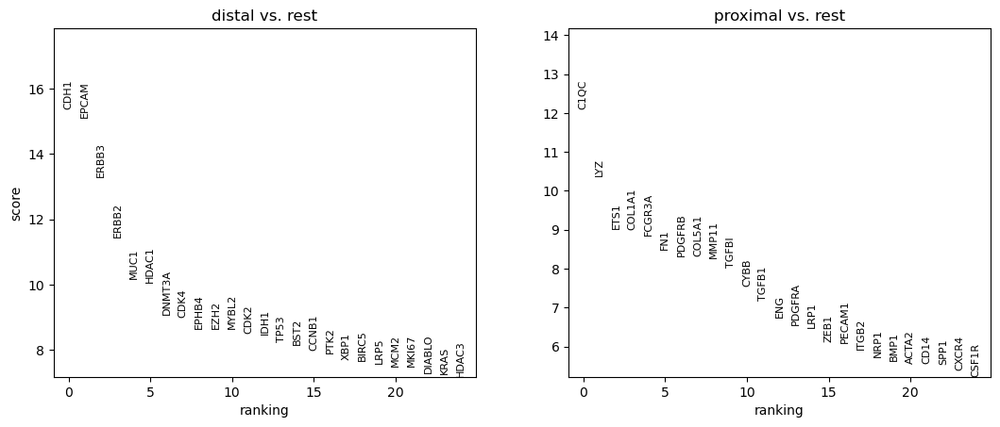

Top 10 logfoldchanges:


,group,names,scores,logfoldchanges,pvals,pvals_adj
500,proximal,C1QC,12.106733,2.380352,9.729215e-34,1.216152e-31
501,proximal,LYZ,10.383063,2.010929,2.961194e-25,2.467661e-23
507,proximal,COL5A1,8.316032,1.918877,9.095723e-17,2.165648e-15
506,proximal,PDGFRB,8.327245,1.854606,8.274568e-17,2.068642e-15
505,proximal,FN1,8.490468,1.765995,2.058064e-17,5.716846e-16
509,proximal,TGFBI,8.033407,1.653459,9.480215e-16,1.896043e-14
504,proximal,FCGR3A,8.853091,1.483857,8.512796e-19,3.274152e-17
524,proximal,CSF1R,5.221811,1.477327,1.771818e-07,1.042293e-06
502,proximal,ETS1,9.016987,1.464378,1.933330e-19,9.566724e-18
513,proximal,PDGFRA,6.541824,1.452698,6.077285e-11,6.330505e-10


Top 10 z-scores:


,group,names,scores,logfoldchanges,pvals,pvals_adj
500,proximal,C1QC,12.106733,2.380352,9.729215e-34,1.216152e-31
501,proximal,LYZ,10.383063,2.010929,2.961194e-25,2.467661e-23
502,proximal,ETS1,9.016987,1.464378,1.933330e-19,9.566724e-18
503,proximal,COL1A1,8.998127,1.047984,2.296014e-19,9.566724e-18
504,proximal,FCGR3A,8.853091,1.483857,8.512796e-19,3.274152e-17
505,proximal,FN1,8.490468,1.765995,2.058064e-17,5.716846e-16
506,proximal,PDGFRB,8.327245,1.854606,8.274568e-17,2.068642e-15
507,proximal,COL5A1,8.316032,1.918877,9.095723e-17,2.165648e-15
508,proximal,MMP11,8.275064,1.258671,1.283869e-16,2.917883e-15
509,proximal,TGFBI,8.033407,1.653459,9.480215e-16,1.896043e-14


In [124]:
col_for_dge = 'proximal-distal'

# subset ad for DGE

proximal_id = proximal_df['target'].to_list()
distal_id = distal_df['target'].to_list()
print(f'There are {len(proximal_id)} proximal cells')
print(f'There are {len(distal_id)} distal cells')

ad_sub = ad[ad.obs.index.isin(proximal_id + distal_id)].copy()
ad_sub.obs[col_for_dge] = ad_sub.obs.index.map(dict(zip(proximal_id + distal_id, ['proximal']*len(proximal_id) +  ['distal']*len(distal_id))))
display(ad_sub.obs)

# processing the counts within the subgroup for more accurate calculation
ad_sub.X = ad_sub.raw.X.copy()

#normalize the total reads of each cell to 1M
sc.pp.normalize_total(ad_sub, target_sum=1e6)
sc.pp.log1p(ad_sub)
#scale each gene to unit variance. Clip values exceeding standard deviation 10.
# sc.pp.scale(ad_sub, max_value=10) # skip scaling to avoid neagative values and nan in log2fc


# Run rank genes groups analysis
sc.tl.rank_genes_groups(ad_sub, col_for_dge, method='wilcoxon', use_raw=False, key_added = f'{col_for_dge}_rank_genes_groups')
sc.pl.rank_genes_groups(ad_sub, n_genes=25, sharey=False, key = f'{col_for_dge}_rank_genes_groups')
plt.close()

# sc.get.rank_genes_groups_df(ad_sub, group = None, key = f'{col_for_dge}_rank_genes_groups')
# get the DGE table
top_n = 10

rgdf = sc.get.rank_genes_groups_df(ad_sub, group = None, key = f'{col_for_dge}_rank_genes_groups')

print(f'Top {top_n} logfoldchanges:')
display(rgdf.sort_values(['group', 'logfoldchanges'], ascending = False).groupby('group', observed=True).head(top_n))

print(f'Top {top_n} z-scores:')
display(rgdf.sort_values(['group', 'scores'], ascending = False).groupby('group', observed=True).head(top_n))

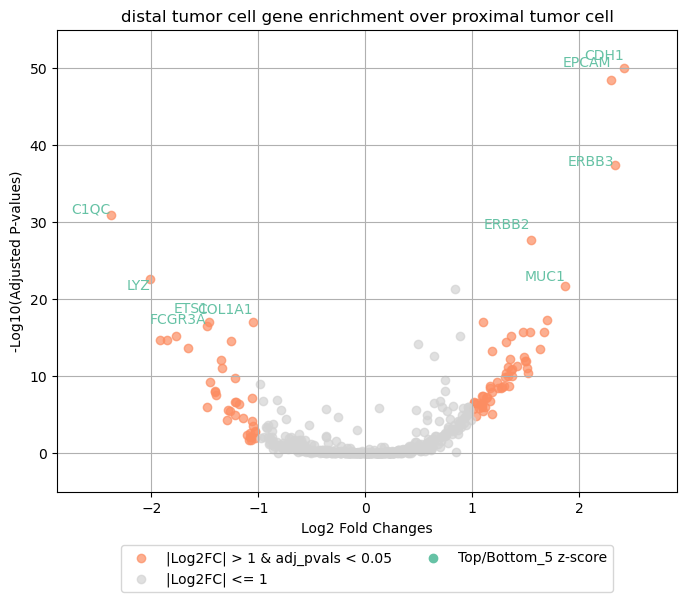

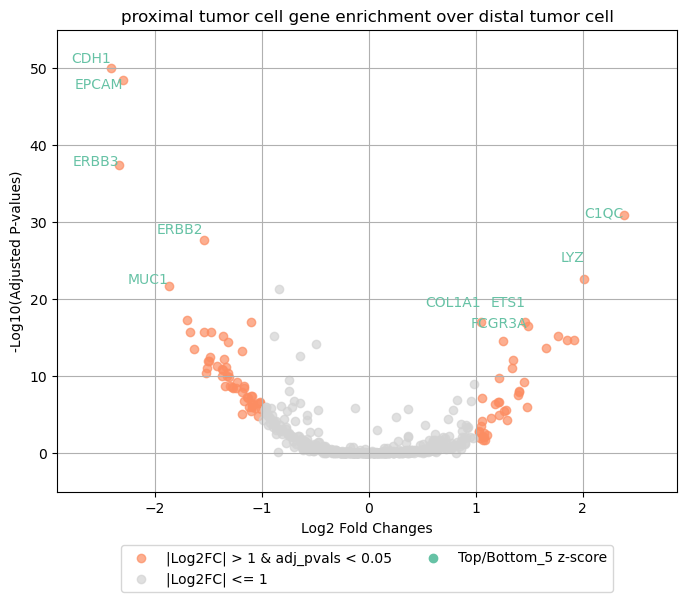

In [125]:
# Create volcano plots with labels for top and bottom n logfoldchanges

# Filter out rows where -log10(pvals_adj) is not finite
rgdf["-log10(pvals_adj)"] = -np.log10(rgdf["pvals_adj"].replace(0, np.nan))
rgdf = rgdf[np.isfinite(rgdf["-log10(pvals_adj)"])]

# Highlight top/bottom 5 scores genes
n = 5  # Number of top and bottom labels
groups = rgdf["group"].unique()

# Updated code with magenta and light gray colors for specific spots
for group in groups:
    group_rgdf = rgdf[rgdf["group"] == group]

    # Sort and select top n and bottom n based on logfoldchanges
    top_n = group_rgdf.nlargest(n, "scores")
    bottom_n = group_rgdf.nsmallest(n, "scores")
    labeled_points = pd.concat([top_n, bottom_n])
    

    plt.figure(figsize=(8, 6))

    # Plot points based on conditions for x-axis (logfoldchanges)
    plt.scatter(
        group_rgdf.loc[
            ((group_rgdf["logfoldchanges"] > 1) | (group_rgdf["logfoldchanges"] < -1)) & (group_rgdf["pvals_adj"] < 0.05),
            "logfoldchanges"
        ],
        group_rgdf.loc[
            ((group_rgdf["logfoldchanges"] > 1) | (group_rgdf["logfoldchanges"] < -1)) & (group_rgdf["pvals_adj"] < 0.05),
            "-log10(pvals_adj)"
        ],
        color='#fc8d62',
        alpha=0.7,
        label="|Log2FC| > 1 & adj_pvals < 0.05"
    )

    plt.scatter(
        group_rgdf.loc[
            (group_rgdf["logfoldchanges"] <= 1) & (group_rgdf["logfoldchanges"] >= -1),
            "logfoldchanges"
        ],
        group_rgdf.loc[
            (group_rgdf["logfoldchanges"] <= 1) & (group_rgdf["logfoldchanges"] >= -1),
            "-log10(pvals_adj)"
        ],
        color='lightgray',
        alpha=0.7,
        label="|Log2FC| <= 1"
    )

    # Add labels for the selected points with jittered y-coordinates
    for _, row in labeled_points.iterrows():
        y_jitter = np.random.uniform(-2, 2)  # Small random shift
        plt.text(
            row["logfoldchanges"],
            row["-log10(pvals_adj)"] + y_jitter,  # Apply the jitter
            row["names"],
            fontsize=10,
            ha='right',
            va='bottom',
            color='#66c2a5'
        )

    # Add a custom legend for labeled points
    plt.scatter([], [], color='#66c2a5', label=f"Top/Bottom_{n} z-score")
    # plt.scatter([], [], color='#e78ac3', label=f"Top/Bottom_{n} log2FC")

    plt.title(f"{group} tumor cell gene enrichment over {', '.join(map(str, filter(lambda x: x != group, groups)))} tumor cell")
    plt.xlabel("Log2 Fold Changes")
    plt.ylabel("-Log10(Adjusted P-values)")
    # Place legend to the bottom of the plot
    plt.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.1),
        frameon=True,
        ncol=2
    )

    plt.xlim(group_rgdf["logfoldchanges"].min()-0.5, group_rgdf["logfoldchanges"].max()+0.5) 
    # plt.ylim(0, 10)

    
    plt.margins(x=0.1, y=0.1) #To ensure all points and labels are visible
    plt.grid(True)
    plt.show()


# Use PyDEseq2 to do pseudobulk DEG on proximal and distal tumor cells
"However, the p-values obtained from this analysis should be interpreted with caution, because these tests treat each cell as an independent replicate and ignore inherent correlations between cells originating from the same sample. Such analyses have been shown to find a large number of false positive associations, as has been demonstrated by Squair et al., 2021, Zimmerman et al., 2021, Junttila et al., 2022, and others."
<a href= "https://satijalab.org/seurat/articles/de_vignette.html#perform-de-analysis-after-pseudobulking></a>

https://www.nature.com/articles/s41467-021-21038-1

https://academic.oup.com/bib/article/23/5/bbac286/6649780?login=false

https://github.com/mousepixels/sanbomics_scripts/blob/521f16b9b4cedb736c28403a557462cffa35f06a/pseudobulk_pyDeseq2.ipynb

https://satijalab.org/seurat/articles/de_vignette.html

Since we only have one biological replicate, here we use pseudo replicates to split each group into 3 repeats

In [126]:
ad_sub.obs

,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,...,Cellbound1_high_pass,PolyT_raw,PolyT_high_pass,DAPI_raw,DAPI_high_pass,barcodeCount,volume_factor,leiden,manual_annot,proximal-distal
267305200243102666,947,1019.878329,6479.705659,6127.012510,6473.650219,6119.482103,6485.393754,6133.140532,1.285171,1221,...,2.289069e+06,7.881190e+08,6.399775e+06,1.418779e+09,3.205114e+07,1230,1.584420,12,Smooth muscle,distal
267305200094100399,222,968.067373,5418.534838,2121.554852,5411.394965,2117.220623,5425.523318,2127.617478,1.398084,672,...,2.738715e+06,8.020034e+08,4.363701e+06,1.318625e+09,2.023693e+07,685,1.503929,1,Cancer cell_2,distal
267305200328101468,1258,617.736811,7211.676127,7979.333851,7207.143693,7974.911205,7216.262823,7983.050772,1.127940,531,...,2.209649e+06,6.260304e+08,3.156383e+06,9.715324e+08,1.025312e+07,532,0.959678,3,Cancer cell_4,distal
267305200027201199,88,894.043838,3266.506581,829.868601,3261.558360,824.796660,3273.519555,834.884991,1.186773,587,...,2.131802e+07,8.250487e+08,6.619220e+06,1.404737e+09,2.268341e+07,589,1.388931,9,Endometrium (antigen presenting),distal
267305200107100921,316,108.588904,1047.482169,2701.649009,1046.035597,2699.139587,1048.885309,2703.943714,1.701196,108,...,7.067444e+05,7.983360e+07,5.970702e+05,1.360583e+08,2.316530e+06,109,0.168697,2,Cancer cell_3,distal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
267305200069103317,233,159.237635,3384.668263,2032.758549,3382.084087,2030.336293,3387.166141,2035.159486,1.734472,262,...,1.452817e+06,1.538622e+08,1.316019e+06,1.910057e+08,3.506926e+06,264,0.247382,6,Endometrium,distal
267305200135200490,431,1350.226370,4763.951383,3280.149611,4756.820241,3272.875593,4770.382576,3286.512923,1.163035,730,...,4.871033e+06,1.148983e+09,6.589288e+06,2.011437e+09,2.802851e+07,735,2.097628,5,Endometrium,distal
267305200027103684,87,539.226975,3519.342395,945.021176,3514.481500,940.296023,3523.552940,949.419985,1.867318,543,...,4.388450e+06,3.587144e+08,2.374031e+06,6.801442e+08,1.048992e+07,544,0.837710,9,Endometrium (antigen presenting),distal
267305200215101543,829,183.530557,3037.604671,5392.436068,3035.503794,5388.722238,3039.406523,5396.131594,2.388704,43,...,2.493903e+06,5.630110e+07,5.759103e+05,1.986256e+08,2.650832e+06,44,0.285122,2,Cancer cell_3,distal


In [127]:
pbs = []
for neighbor in ad_sub.obs['proximal-distal'].unique():
    samp_ad_sub = ad_sub[ad_sub.obs['proximal-distal'] == neighbor]
    
    samp_ad_sub.X = samp_ad_sub.layers['counts'] #make sure to use raw data
    
    
    indices = list(samp_ad_sub.obs_names)
    random.shuffle(indices)
    indices = np.array_split(np.array(indices), 3) #change number here for number of replicates deisred
    
    for i, pseudo_rep in enumerate(indices):
    
        rep_adata = sc.AnnData(X = samp_ad_sub[indices[i]].X.sum(axis = 0).reshape(1, -1),
                               var = samp_ad_sub[indices[i]].var[[]])

        rep_adata.obs_names = [neighbor + '_' + str(i)]
        rep_adata.obs['neighbor'] = samp_ad_sub.obs['proximal-distal'].iloc[0]
        rep_adata.obs['replicate'] = i

        pbs.append(rep_adata)



In [128]:
pb = sc.concat(pbs)
pb.obs

,neighbor,replicate
distal_0,distal,0
distal_1,distal,1
distal_2,distal,2
proximal_0,proximal,0
proximal_1,proximal,1
proximal_2,proximal,2


In [129]:
!pip -q install pydeseq2

In [130]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [131]:
counts = pd.DataFrame(pb.X, columns = pb.var_names)

In [132]:
dds = DeseqDataSet(
    adata=pb,
    # counts = counts, # seems no need to provide here if there is already counts in .X field
    # metadata = pb.obs, # seems no need to provide here because metadata already exist in adata
    design_factors=["replicate", "neighbor"])

dds

C:\Users\ChengYiChen\AppData\Local\Temp\ipykernel_14188\938165076.py:1: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(


AnnData object with n_obs × n_vars = 6 × 500
    obs: 'neighbor', 'replicate'
    obsm: 'design_matrix'

In [133]:
sc.pp.filter_genes(dds, min_cells = 1)
dds

AnnData object with n_obs × n_vars = 6 × 500
    obs: 'neighbor', 'replicate'
    var: 'n_cells'
    obsm: 'design_matrix'

In [134]:
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.02 seconds.

c:\Users\ChengYiChen\anaconda3\Lib\site-packages\pydeseq2\dds.py:541: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.11 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.



computing PCA
    with n_comps=5
    finished (0:00:00)


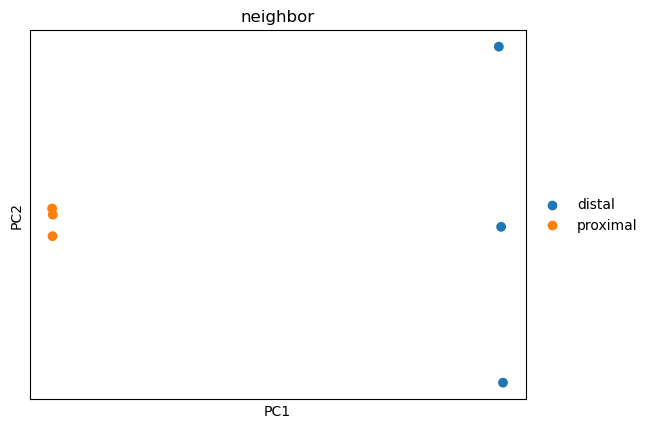

In [135]:
sc.tl.pca(dds)
sc.pl.pca(dds, color = 'neighbor', size = 200)

In [136]:
stat_res = DeseqStats(dds, contrast=('neighbor', 'proximal', 'distal'))
    
stat_res.summary()

Log2 fold change & Wald test p-value: neighbor proximal vs distal
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
PDK4     1261.365368       -0.002629  0.066930 -0.039275  9.686715e-01   
CCL26      94.372913        0.117354  0.259477  0.452272  6.510730e-01   
CX3CL1    649.130688        0.671821  0.102962  6.524947  6.802554e-11   
PGLYRP1    44.245053       -0.070983  0.328895 -0.215824  8.291252e-01   
CD4       447.703826        0.819492  0.102125  8.024414  1.020117e-15   
...              ...             ...       ...       ...           ...   
ATM       251.297673       -0.153906  0.143081 -1.075655  2.820816e-01   
PRF1       91.466954        0.187403  0.222397  0.842654  3.994219e-01   
IL10       81.213579       -0.113288  0.265897 -0.426059  6.700651e-01   
IL17A      68.283021       -0.323241  0.279790 -1.155299  2.479680e-01   
NOTCH1   3217.186879       -0.128186  0.049133 -2.608943  9.082235e-03   

                 padj  
PDK4     9.816072e-01

Running Wald tests...
... done in 0.11 seconds.



In [137]:
de  = stat_res.results_df.copy()
de['names'] = de.index.copy()
de.sort_values('stat', ascending = False)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,names
COL5A1,2532.959819,1.074948,0.052752,20.377561,2.645091e-92,1.322545e-89,COL5A1
ACTA2,5079.456085,0.797569,0.044449,17.943418,5.402693e-72,9.004488e-70,ACTA2
C1QC,1837.586146,1.055488,0.070635,14.942912,1.732358e-50,2.165448e-48,C1QC
COL1A1,21781.587416,0.978787,0.070464,13.890576,7.225176e-44,7.225176e-42,COL1A1
LRP1,4346.099302,0.530422,0.038668,13.717401,7.987773e-43,6.656477e-41,LRP1
...,...,...,...,...,...,...,...
BST2,21689.998430,-0.321384,0.031531,-10.192527,2.141250e-24,8.235576e-23,BST2
CDK4,6262.540026,-0.412629,0.040158,-10.275082,9.126636e-25,3.802765e-23,CDK4
JUNB,12348.423199,-0.329921,0.031369,-10.517528,7.173087e-26,3.260494e-24,JUNB
JUN,11479.405292,-0.335001,0.028109,-11.917898,9.548768e-33,5.967980e-31,JUN


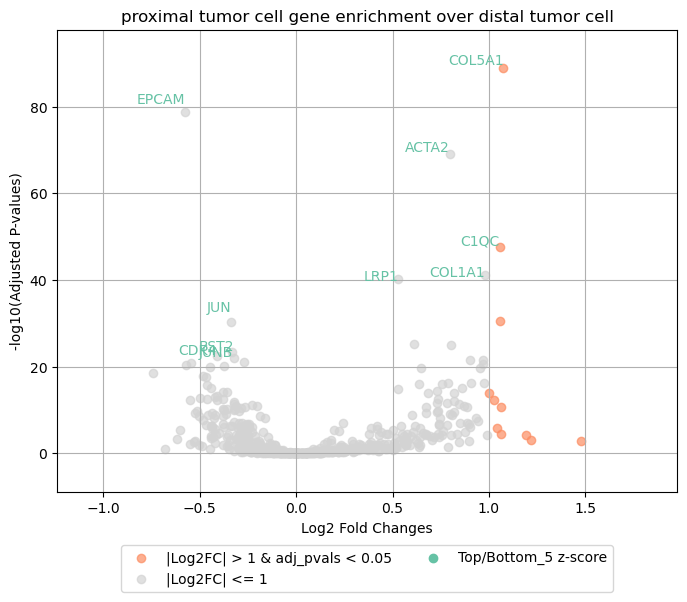

In [138]:
# volcano plot

groups = rgdf["group"].unique()
group = 'proximal'

# Filter out rows where -log10(padj) is not finite
de["-log10(padj)"] = -np.log10(de["padj"].replace(0, np.nan))
de = de[np.isfinite(de["-log10(padj)"])]

n = 5  # Number of top and bottom labels

# Sort and select top n and bottom n based on log2FoldChange
top_n = de.nlargest(n, "stat")
bottom_n = de.nsmallest(n, "stat")
labeled_points = pd.concat([top_n, bottom_n])


plt.figure(figsize=(8, 6))

# Plot points based on conditions for x-axis (log2FoldChange)
plt.scatter(
    de.loc[
        ((de["log2FoldChange"] > 1) | (de["log2FoldChange"] < -1)) & (de["padj"] < 0.05),
        "log2FoldChange"
    ],
    de.loc[
        ((de["log2FoldChange"] > 1) | (de["log2FoldChange"] < -1)) & (de["padj"] < 0.05),
        "-log10(padj)"
    ],
    color='#fc8d62',
    alpha=0.7,
    label="|Log2FC| > 1 & adj_pvals < 0.05"
)

plt.scatter(
    de.loc[
        (de["log2FoldChange"] <= 1) & (de["log2FoldChange"] >= -1),
        "log2FoldChange"
    ],
    de.loc[
        (de["log2FoldChange"] <= 1) & (de["log2FoldChange"] >= -1),
        "-log10(padj)"
    ],
    color='lightgray',
    alpha=0.7,
    label="|Log2FC| <= 1"
)

# Add labels for the selected points with jittered y-coordinates
for _, row in labeled_points.iterrows():
    y_jitter = np.random.uniform(-2, 2)  # Small random shift
    plt.text(
        row["log2FoldChange"],
        row["-log10(padj)"] + y_jitter,  # Apply the jitter
        row["names"],
        fontsize=10,
        ha='right',
        va='bottom',
        color='#66c2a5'
    )

# Add a custom legend for labeled points
plt.scatter([], [], color='#66c2a5', label=f"Top/Bottom_{n} z-score")
# plt.scatter([], [], color='#e78ac3', label=f"Top/Bottom_{n} log2FC")

plt.title(f"{group} tumor cell gene enrichment over {', '.join(map(str, filter(lambda x: x != group, groups)))} tumor cell")
plt.xlabel("Log2 Fold Changes")
plt.ylabel("-log10(Adjusted P-values)")
# Place legend to the bottom of the plot
plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.1),
    frameon=True,
    ncol=2
)

plt.xlim(de["log2FoldChange"].min()-0.5, de["log2FoldChange"].max()+0.5) 
# plt.ylim(0, 10)


plt.margins(x=0.1, y=0.1) #To ensure all points and labels are visible
plt.grid(True)
plt.show()


# Compare scanpy.tl.rank_genes_groups and PyDEseq2 results

In [139]:
rk = rgdf.copy()
rk = rk[rk['group'] == 'proximal']
rk.set_index('names', inplace= True, drop = False)

display(rk)
display(de)

,group,names,scores,logfoldchanges,pvals,pvals_adj,-log10(pvals_adj)
names,,,,,,,
C1QC,proximal,C1QC,12.106733,2.380352,9.729215e-34,1.216152e-31,30.915012
LYZ,proximal,LYZ,10.383063,2.010929,2.961194e-25,2.467661e-23,22.607714
ETS1,proximal,ETS1,9.016987,1.464378,1.933330e-19,9.566724e-18,17.019237
COL1A1,proximal,COL1A1,8.998127,1.047984,2.296014e-19,9.566724e-18,17.019237
FCGR3A,proximal,FCGR3A,8.853091,1.483857,8.512796e-19,3.274152e-17,16.484901
...,...,...,...,...,...,...,...
MUC1,proximal,MUC1,-10.185724,-1.869196,2.296427e-24,1.640305e-22,21.785075
ERBB2,proximal,ERBB2,-11.457503,-1.543436,2.156421e-30,2.156421e-28,27.666267
ERBB3,proximal,ERBB3,-13.305539,-2.329304,2.149373e-40,3.582288e-38,37.445840


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,names,-log10(padj)
PDK4,1261.365368,-0.002629,0.066930,-0.039275,9.686715e-01,9.816072e-01,PDK4,0.008062
CCL26,94.372913,0.117354,0.259477,0.452272,6.510730e-01,7.518164e-01,CCL26,0.123888
CX3CL1,649.130688,0.671821,0.102962,6.524947,6.802554e-11,4.417243e-10,CX3CL1,9.354849
PGLYRP1,44.245053,-0.070983,0.328895,-0.215824,8.291252e-01,8.839288e-01,PGLYRP1,0.053583
CD4,447.703826,0.819492,0.102125,8.024414,1.020117e-15,1.244045e-14,CD4,13.905164
...,...,...,...,...,...,...,...,...
ATM,251.297673,-0.153906,0.143081,-1.075655,2.820816e-01,3.874747e-01,ATM,0.411757
PRF1,91.466954,0.187403,0.222397,0.842654,3.994219e-01,5.124060e-01,PRF1,0.290386
IL10,81.213579,-0.113288,0.265897,-0.426059,6.700651e-01,7.631945e-01,IL10,0.117365
IL17A,68.283021,-0.323241,0.279790,-1.155299,2.479680e-01,3.482697e-01,IL17A,0.458084


In [140]:
padjfc = pd.DataFrame({'prk' : rk['pvals_adj'], # rk: from the single-cell analysis of scanpy.rank_genes_groups
                        'pde' :  de['padj'], # de: from PyDEseq2. pseudo-bulk
                        'fcrk' : rk['logfoldchanges'],
                        'fcde' : de['log2FoldChange']})
padjfc

,prk,pde,fcrk,fcde
ACKR3,8.577925e-02,7.102190e-05,0.478033,0.430639
ACTA2,1.812558e-07,9.004488e-70,0.952606,0.797569
ADAMTS4,1.680461e-01,1.362562e-04,0.556175,0.713193
AKT1,3.275774e-10,4.182698e-11,-0.747174,-0.287164
AKT2,9.672984e-01,8.014188e-01,-0.014838,0.035057
...,...,...,...,...
XCR1,9.822679e-01,8.783761e-01,-0.008894,0.033262
YAP1,1.546696e-07,2.014320e-11,-0.693677,-0.265926
ZAP70,2.383517e-02,9.806972e-06,0.865756,0.607331
ZBED2,9.053585e-01,9.870943e-01,-0.109236,0.002861


In [141]:
# genes can be separated into rk and de double significant (p<0.05), rk-only significant, de-only significant and double insignificant

double_sig = padjfc[(padjfc['prk'] < 0.05) & (padjfc['pde'] < 0.05)].index.to_list() # double significant genes
prk_sig = padjfc[(padjfc['prk'] < 0.05) & (padjfc['pde'] > 0.05)].index.to_list() # only DE genes by single-cell analysis (scanpy)
pde_sig = padjfc[(padjfc['prk'] > 0.05) & (padjfc['pde'] < 0.05)].index.to_list() # only DE genes by pseudo-bulk (PyDEseq2)
double_in_sig = padjfc[(padjfc['prk'] > 0.05) & (padjfc['pde'] > 0.05)].index.to_list() # double insignificant genes

print(len(double_sig))
print(len(prk_sig))
print(len(pde_sig))
print(len(double_in_sig))

197
3
86
214


In [142]:
from pandas.api.types import CategoricalDtype
t = CategoricalDtype(categories=['proximal', 'distal'], ordered=True)
ad_sub.obs['proximal-distal'] = ad_sub.obs['proximal-distal'].astype(t)

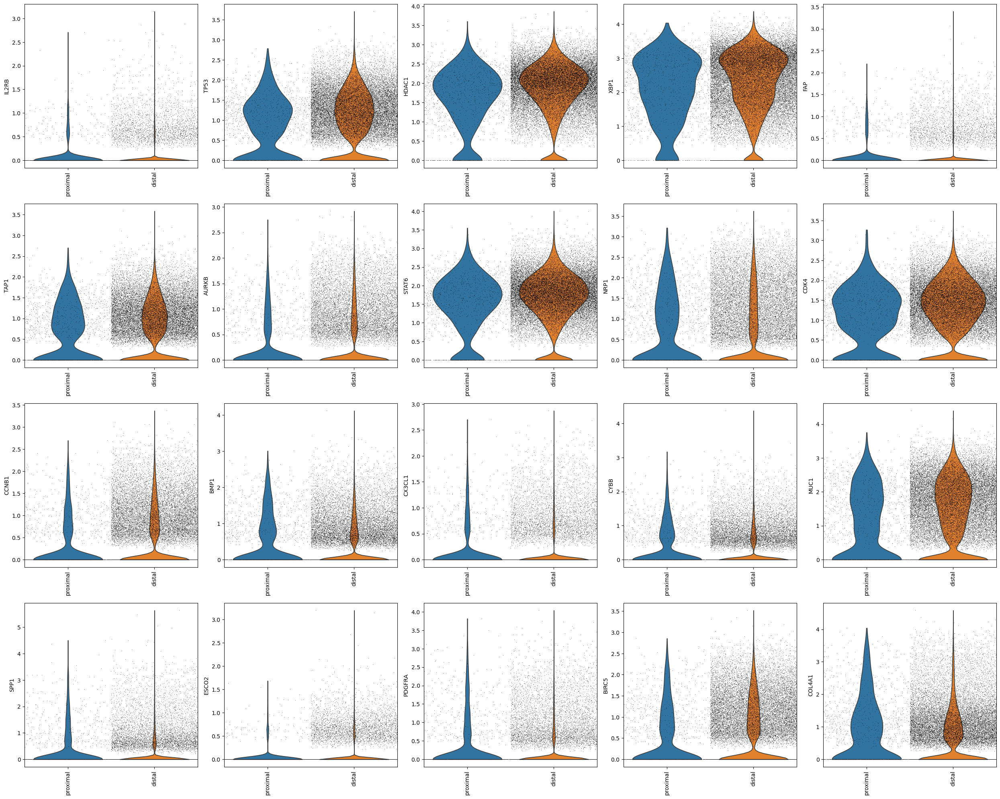

In [143]:
# violin plot of randomly selected double significant genes from proximal and distal tumor differential gene expression analysis

random_double_sig = random.sample(double_sig, 20)

# Define the number of columns
n_cols = 5
n_rows = int(np.ceil(len(random_double_sig) / n_cols))  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()  # Flatten the array for easy indexing

# Loop through genes and create violin plots
for i, gene in enumerate(random_double_sig):
    sc.pl.violin(
        ad_sub,
        keys=gene,
        groupby='proximal-distal',
        rotation=90,
        size = 0.5,
        jitter=0.5,  # Control jitter spread
        ax=axes[i],  # Assign the plot to the correct subplot
        show = False
    )

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


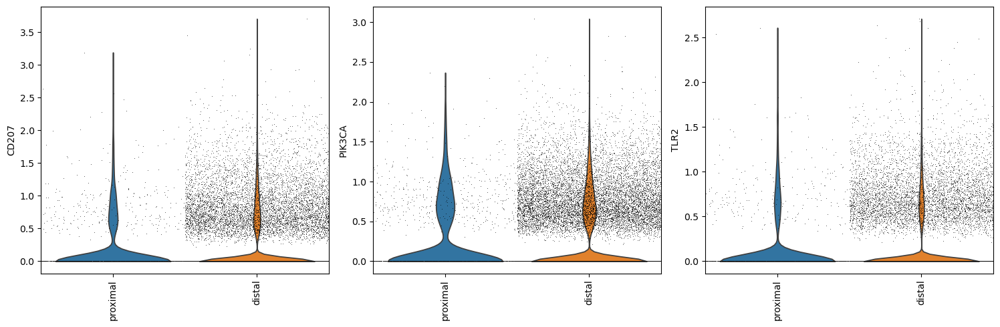

In [144]:
# violin plot of only DE genes by single-cell analysis (scanpy)

# Define the number of columns
n_cols = 5
n_rows = int(np.ceil(len(prk_sig) / n_cols))  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()  # Flatten the array for easy indexing

# Loop through genes and create violin plots
for i, gene in enumerate(prk_sig):
    sc.pl.violin(
        ad_sub,
        keys=gene,
        groupby='proximal-distal',
        rotation=90,
        size = 0.5,
        jitter=0.5,  # Control jitter spread
        ax=axes[i],  # Assign the plot to the correct subplot
        show = False
    )

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


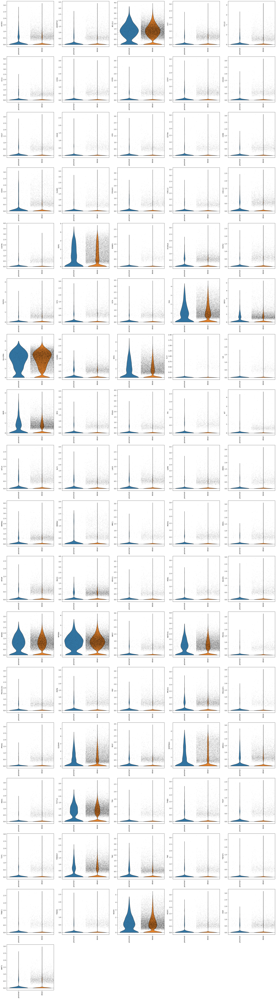

In [145]:
# violin plot of only DE genes by pseudo-bulk (PyDEseq2)

# Define the number of columns
n_cols = 5
n_rows = int(np.ceil(len(pde_sig) / n_cols))  # Calculate the number of rows needed

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()  # Flatten the array for easy indexing

# Loop through genes and create violin plots
for i, gene in enumerate(pde_sig):
    sc.pl.violin(
        ad_sub,
        keys=gene,
        groupby='proximal-distal',
        rotation=90,
        size = 0.5,
        jitter=0.5,  # Control jitter spread
        ax=axes[i],  # Assign the plot to the correct subplot
        show = False
    )

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


# Print the environment set up

In [146]:
!pip list

Package                           Version
--------------------------------- ------------------
aext-assistant                    4.0.15
aext-assistant-server             4.0.15
aext-core                         4.0.15
aext-core-server                  4.0.15
aext-panels                       4.0.15
aext-panels-server                4.0.15
aext-share-notebook               4.0.15
aext-share-notebook-server        4.0.15
aext-shared                       4.0.15
affine                            2.4.0
aiobotocore                       2.12.3
aiohttp                           3.9.5
aioitertools                      0.7.1
aiosignal                         1.2.0
alabaster                         0.7.16
altair                            5.0.1
altgraph                          0.17.4
anaconda-anon-usage               0.4.4
anaconda-catalogs                 0.2.0
anaconda-client                   1.12.3
anaconda-cloud-auth               0.5.1
anaconda-navigator                2.6.3
anaconda-pro